<a href="https://colab.research.google.com/github/hiiamjay/Deep-Learning/blob/main/CNN_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !pip install wandb

In [2]:
# # Importing the libraries

# import tensorflow
# from keras.layers import Lambda, Reshape, Permute, Input, GaussianNoise, concatenate, Conv2D
# from keras.layers import ConvLSTM2D, BatchNormalization, TimeDistributed, Add, Dropout, MaxPooling2D, UpSampling2D
# from keras.models import Model
# import wandb
# from keras.callbacks import Callback
# import numpy as np
# import wandb
# import matplotlib.pyplot as plt

# from keras.models import Sequential
# from keras.callbacks import Callback
# from keras.layers import Conv2D, MaxPooling2D, Dropout, Dense, Flatten, UpSampling2D
# from keras import backend as K

# import random
# import glob
# import wandb
# from wandb.keras import WandbCallback
# import subprocess
# import os
# from PIL import Image
# import numpy as np
# from matplotlib.pyplot import imshow, figure

# import numpy as np
# import glob
# from keras.preprocessing import image

In [3]:
# Define the parameters
HEG = 256 # Height of the image
WID = 444 # Width of the image
FRAME = 5 # Number of frames

In [4]:
# Initialize the wandb
wandb.login(key="gogetyourgoddammkey-mai-nahi-bataunga")
hyperparams = {"num_epochs": 25,
          "batch_size": 4,
          "height": HEG,
          "width": WID}

wandb.init(config=hyperparams)
config = wandb.config

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: jayprajapati1141 (hiiamjay). Use `wandb login --relogin` to force relogin


In [ ]:
# !wandb login --relogin

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [7]:
def load_data_sequence(img_folder, img_width, img_height, sequence_length=5):
    # This will hold all sequences, each with sequence_length - 1 input images,
    # and 1 target image, all stacked along the last dimension
    video_data_list = []
    next_frame_data_list = []

    img_paths = sorted(glob.glob(img_folder + '/*.png'))
    num_sequences = len(img_paths) - sequence_length + 1

    # Loop over the dataset to create sequences
    for seq_start in range(num_sequences):
        seq_end = seq_start + sequence_length
        sequence_imgs = [
            image.img_to_array(
                image.load_img(img_paths[i], target_size=(img_width, img_height), color_mode='rgb')
            ) for i in range(seq_start, seq_end)
        ]

        # Normalize images to [-1, 1]
        sequence_imgs = [(img - 127.5) / 127.5 for img in sequence_imgs]
        # sequence_imgs = [img/255 for img in sequence_imgs]

        # Stack the sequence along the channel axis to form a single array
        video_data_list.append(np.concatenate(sequence_imgs[:-1], axis=-1))
        next_frame_data_list.append(sequence_imgs[-1])

    return np.array(video_data_list), np.array(next_frame_data_list)

# Usage
dataset_path = '/content/drive/MyDrive/Deep-Learning/Geo/Data/USC'
img_width = HEG
img_height = WID
sequence_length = FRAME  # Adjust based on how many frames you want per sequence
videos, next_frames = load_data_sequence(dataset_path, img_width, img_height, sequence_length)

print(f"videos shape: {videos.shape}")  # Should be (num_sequences, img_height, img_width, (sequence_length-1) * channels)
print(f"next_frames shape: {next_frames.shape}")  # Should be (num_sequences, img_height, img_width, channels)


videos shape: (164, 256, 444, 12)
next_frames shape: (164, 256, 444, 3)


In [8]:
from sklearn.model_selection import train_test_split

# Split data into training and validation sets
train_X, validation_X, train_y, validation_y = train_test_split(videos, next_frames, test_size=0.2, random_state=42, shuffle=False)

print(f"Training input shape: {train_X.shape}")
print(f"Training target shape: {train_y.shape}")
print(f"Validation input shape: {validation_X.shape}")
print(f"Validation target shape: {validation_y.shape}")

Training input shape: (131, 256, 444, 12)
Training target shape: (131, 256, 444, 3)
Validation input shape: (33, 256, 444, 12)
Validation target shape: (33, 256, 444, 3)


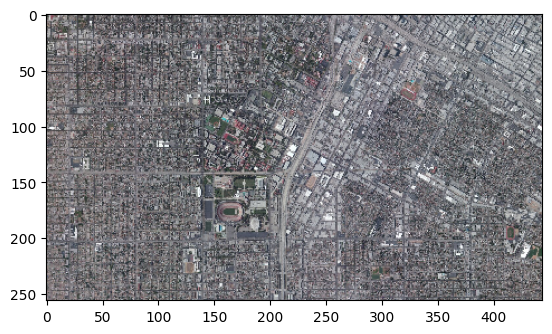

In [9]:
# Rescale the pixel values to [0, 1] for matplotlib by reversing the normalization
plt.imshow((videos[0][:,:,3:6] + 1) / 2)  # Selects the first 3 channels of the first sequence, which is the first frame

In [10]:
class ImageCallback(Callback):
    def __init__(self, validation_data, num_samples=15):
        """
        Initializes the callback with validation data.

        Args:
        - validation_data: A tuple (validation_X, validation_y) of numpy arrays.
        - num_samples: Number of samples to log images for. Defaults to 15.
        """
        super().__init__()
        self.validation_data = validation_data
        self.num_samples = num_samples

    def on_epoch_end(self, epoch, logs=None):
        # Sample a batch of data
        validation_X, validation_y = self.validation_data
        idxs = np.random.choice(range(len(validation_X)), size=self.num_samples, replace=False)
        validation_X_sample = validation_X[idxs]
        validation_y_sample = validation_y[idxs]

        # Predict
        output = self.model.predict(validation_X_sample)

        # Log images to wandb
        wandb.log({
            "input": [wandb.Image(np.concatenate(np.split(c, 4, axis=2), axis=1)) for c in validation_X_sample],
            "output": [wandb.Image(np.concatenate([validation_y_sample[i], o], axis=1)) for i, o in enumerate(output)]
        }, commit=False)


In [11]:
# Function for measuring how similar two images are
def perceptual_distance(y_true, y_pred):
    y_true *= 255.
    y_pred *= 255.
    rmean = (y_true[:, :, :, 0] + y_pred[:, :, :, 0]) / 2
    r = y_true[:, :, :, 0] - y_pred[:, :, :, 0]
    g = y_true[:, :, :, 1] - y_pred[:, :, :, 1]
    b = y_true[:, :, :, 2] - y_pred[:, :, :, 2]

    return K.mean(K.sqrt((((512+rmean)*r*r)/256) + 4*g*g + (((767-rmean)*b*b)/256)))

In [ ]:
def slice(x):
    return x[:,:,:,:, -1]

wandb.init(config=hyperparams)
config = wandb.config

c=4

inp = Input((config.height, config.width, 4 * 3))
reshaped = Reshape((config.height,config.width,4,3))(inp)
permuted = Permute((1,2,4,3))(reshaped)
noise = GaussianNoise(0.1)(permuted)
last_layer = Lambda(slice, input_shape=(config.width,config.height,3,4), output_shape=(config.height,config.width,3))(noise)
x = Permute((4,1,2,3))(noise)
x =(ConvLSTM2D(filters=c, kernel_size=(3,3),padding='same',name='conv_lstm1', return_sequences=True))(x)

c1=(BatchNormalization())(x)
x = Dropout(0.2)(x)
x =(TimeDistributed(MaxPooling2D(pool_size=(2,2))))(c1)

x =(ConvLSTM2D(filters=2*c,kernel_size=(3,3),padding='same',name='conv_lstm3',return_sequences=True))(x)
c2=(BatchNormalization())(x)
x = Dropout(0.2)(x)

x =(TimeDistributed(MaxPooling2D(pool_size=(2,2))))(c2)
x =(ConvLSTM2D(filters=4*c,kernel_size=(3,3),padding='same',name='conv_lstm4',return_sequences=True))(x)

x =(TimeDistributed(UpSampling2D(size=(2, 2))))(x)
x =(ConvLSTM2D(filters=4*c,kernel_size=(3,3),padding='same',name='conv_lstm5',return_sequences=True))(x)
x =(BatchNormalization())(x)

x =(ConvLSTM2D(filters=2*c,kernel_size=(3,3),padding='same',name='conv_lstm6',return_sequences=True))(x)
x =(BatchNormalization())(x)
x = Add()([c2, x])
x = Dropout(0.2)(x)

x =(TimeDistributed(UpSampling2D(size=(2, 2))))(x)
x =(ConvLSTM2D(filters=c,kernel_size=(3,3),padding='same',name='conv_lstm7',return_sequences=False))(x)
x =(BatchNormalization())(x)
combined = concatenate([last_layer, x])
combined = Conv2D(3, (1,1))(combined)
model=Model(inputs=[inp], outputs=[combined])

model.compile(optimizer='adam', loss='mse', metrics=[perceptual_distance])

# Assuming train_X, train_y, validation_X, validation_y are pre-loaded numpy arrays
model.fit(train_X, train_y,
          batch_size=config.batch_size,
          epochs=config.num_epochs,
          callbacks=[ImageCallback(validation_data=(validation_X, validation_y)), WandbCallback()],
          validation_data=(validation_X, validation_y),
          steps_per_epoch=max(1, len(train_X) // config.batch_size),
          validation_steps=max(1, len(validation_X) // config.batch_size))


wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


Epoch 1/25


Location: Seattle

Run 1 (96 x 96) : https://wandb.ai/hiiamjay/uncategorized/runs/7qemgc16/workspace?nw=nwuserjayprajapati1141

Run 2 (256 x 256) : https://wandb.ai/hiiamjay/uncategorized/runs/u6l1a1n9?nw=nwuserjayprajapati1141

Run 3 (Scaling Changed) : https://wandb.ai/hiiamjay/uncategorized/runs/50977lys?nw=nwuserjayprajapati1141 [Failed]

Run 4 (256 x 444) : https://wandb.ai/hiiamjay/uncategorized/runs/gm26jl5a?nw=nwuserjayprajapati1141

Run 5 (Epoch 10 -> 50) : https://wandb.ai/hiiamjay/uncategorized/runs/f6d70dlg?nw=nwuserjayprajapati1141


Location: Las Vegas (LV - 1)

Run 1 (256 x 444, Epoch - 50) : https://wandb.ai/hiiamjay/uncategorized/runs/stqxsvfl?nw=nwuserjayprajapati1141


Run 2 (Frame - 10, Epoch - 25) : https://wandb.ai/hiiamjay/uncategorized/runs/gzsf02nd?nw=nwuserjayprajapati1141


Run 3 (Suffle - False) : https://wandb.ai/hiiamjay/uncategorized/runs/c0pjf0uc?nw=nwuserjayprajapati1141


Location: Las Vegas (USC)

Run 1 : https://wandb.ai/hiiamjay/uncategorized/runs/ft3racx7?nw=nwuserjayprajapati1141





# Testing


In [15]:
tensorflow.keras.models.save_model(model, '/content/drive/MyDrive/USC_Model.h5')

<ipython-input-15-af9d941009d2>:2: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  tensorflow.keras.models.save_model(model, '/content/drive/MyDrive/USC_Model.h5')


In [18]:
# aa = tensorflow.keras.models.load_model('/content/drive/MyDrive/USC_Model.h5')

aaa = tensorflow.keras.models.load_model('/content/drive/MyDrive/USC_Model.h5', custom_objects={'perceptual_distance': perceptual_distance})

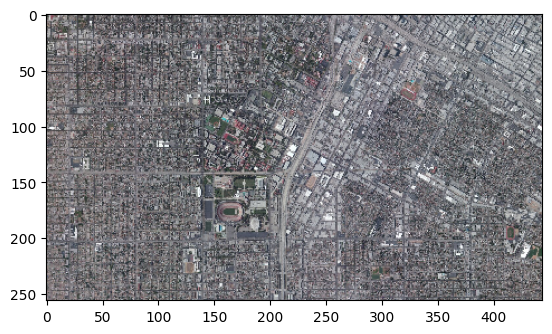

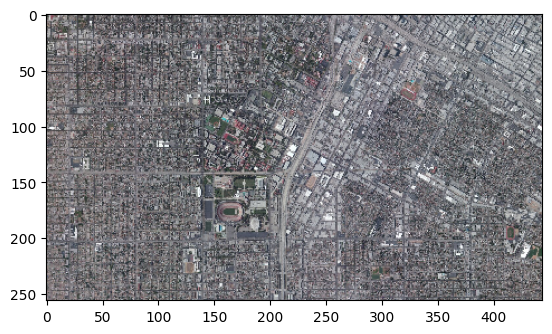

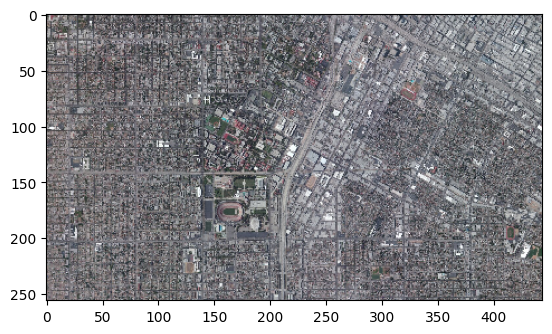

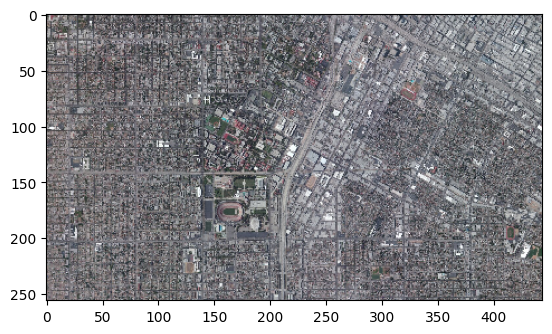

In [19]:
x= train_X[0]
plt.imshow((x[:,:,0:3] + 1) / 2)
plt.show()

plt.imshow((x[:,:,3:6] + 1) / 2)
plt.show()

plt.imshow((x[:,:,6:9] + 1) / 2)
plt.show()

plt.imshow((x[:,:,9:12] + 1) / 2)
plt.show()

In [20]:
inputX = np.expand_dims(x, axis=0)
out = aaa.predict(inputX)

1/1 [==============================] - 1s 1s/step


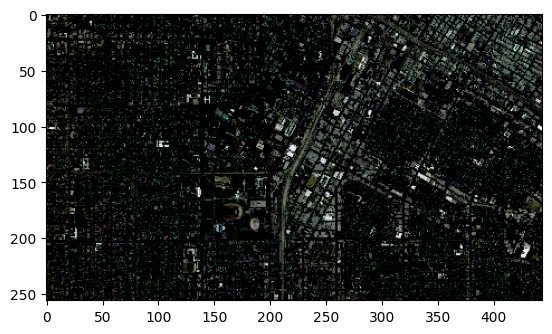

In [70]:
outPrint = np.reshape(out, (256, 444, 3))
plt.imshow(outPrint)

In [71]:
def generate_images(model, initial_input, num_images):
    generated_images = []
    current_input = initial_input

    for i in range(num_images):
        # Predict using the current input
        output = model.predict(current_input)

        # Reshape the output to image shape (256, 444, 3)
        generated_image = np.reshape(output, (256, 444, 3))

        # Append the generated image to the list
        generated_images.append(generated_image)

        # Update the current input for the next iteration
        current_input = np.concatenate((current_input[:, :, :, 3:], output), axis=3)

    return generated_images

In [ ]:
initial_input = validation_X[10]  # Replace this with your actual input data
initial_input = np.expand_dims(initial_input, axis=0)  # Add batch dimension
num_images = 60  # Replace this with the desired number of sequential images to generate

# Generate sequential images
generated_images = generate_images(model, initial_input, num_images)

for i, image in enumerate(generated_images):
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f"Generated Image {i+1}")
    plt.show()

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

# Assuming you have already defined initial_input, num_images, and generated_images as mentioned in your code

# Scale images back to [0, 255] range and convert to uint8
generated_images = [(image * 255).astype(np.uint8) for image in generated_images]

# Save the generated images as a GIF
gif_path = "generated_images.gif"
imageio.mimsave(gif_path, generated_images, duration=2)  # Adjust duration as needed

print(f"Generated GIF saved at: {gif_path}")


Generated GIF saved at: generated_images.gif


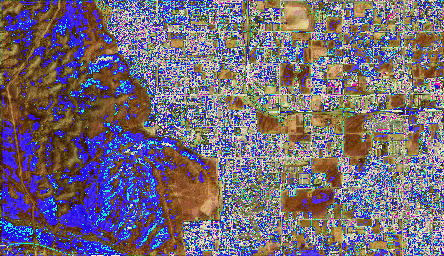

In [74]:
from IPython.display import Image

# Assuming you have already defined gif_path
gif_path = "generated_images.gif"

# Display the GIF
Image(filename=gif_path)

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

# Assuming you have already defined initial_input, num_images, and generated_images as mentioned in your code

# Scale images back to [0, 255] range and convert to uint8
generated_images = [(image * 255).astype(np.uint8) for i, image in enumerate(train_y)]
print(i)

# Save the generated images as a GIF
gif_path = "og_generated_images.gif"
imageio.mimsave(gif_path, generated_images, duration=100)  # Adjust duration as needed

print(f"Generated GIF saved at: {gif_path}")

29
Generated GIF saved at: og_generated_images.gif


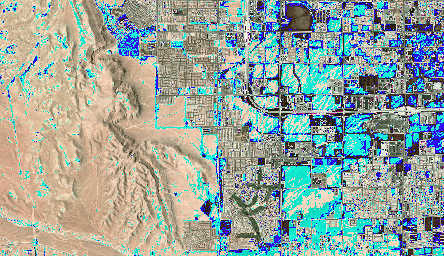

In [49]:
Image(filename="og_generated_images.gif")

In [40]:
inputX.shape

(1, 256, 444, 12)

In [59]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# Define a function to compute the Grad-CAM heatmap for each input image
def compute_grad_cam_for_inputs(model, input_images):
    # Get the last convolutional layer in the model
    last_conv_layer = None
    for layer in reversed(model.layers):
        if 'conv2d' in layer.name:
            last_conv_layer = layer
            break

    if last_conv_layer is None:
        raise ValueError("No convolutional layer found in the model.")

    # Define a custom gradient model that computes gradients of the model output with respect to the last convolutional layer
    grad_model = Model(
        inputs=[model.input],
        outputs=[last_conv_layer.output, model.output]
    )

    heatmaps = []
    r = 0
    for i in range(input_images.shape[-1] // 3):  # Assuming each image has groups of three channels
        # Expand dimensions to match the expected shape (None, 256, 444, 12)
        image = input_images[:, :, :, r:r+3]
        # Convert to TensorFlow tensor
        image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)

        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(image_tensor)
            class_output = predictions[:, np.argmax(predictions[0])]

        # Get the gradients of the predicted class with respect to the conv_outputs
        grads = tape.gradient(class_output, conv_outputs)[0]

        # Compute the global average pooling of the gradients
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

        # Multiply each channel in the feature map array by "how important this channel is" with regard to the predicted class
        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

        # Normalize the heatmap
        heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

        heatmaps.append(heatmap.numpy())
        r += 3

    return heatmaps

# Assuming input_images is the array containing the 4 input images stacked together
# No need to resize or normalize as they are already preprocessed
# input_images = ...  # Your input images array with shape (1, 256, 444, 12)

# Assuming aaa is your model
# Compute Grad-CAM heatmaps for each input image
heatmaps = compute_grad_cam_for_inputs(aaa, inputX)

# Visualize the Grad-CAM heatmaps for each input image
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.subplot(2, 6, i+1)
    plt.imshow(inputX[0, :, :, i*3:i*3+3], cmap='gray')  # Display each group of 3 channels as one image
    plt.title(f'Input {i+1}')
    plt.axis('off')

    plt.subplot(2, 6, i+7)
    plt.imshow(heatmaps[i].squeeze(), cmap='jet', alpha=0.5)
    plt.title


ValueError: Input 0 of layer "model_17" is incompatible with the layer: expected shape=(None, 256, 444, 12), found shape=(1, 256, 444, 3)

In [72]:
def compute_grad_cam_for_inputs(model, input_images):
    # Get the last convolutional layer in the model
    last_conv_layer = None
    for layer in reversed(model.layers):
        if isinstance(layer, Conv2D):
            last_conv_layer = layer
            break

    if last_conv_layer is None:
        raise ValueError("No convolutional layer found in the model.")

    # Define a custom gradient model that computes gradients of the model output with respect to the last convolutional layer
    grad_model = Model(
        inputs=[model.input],
        outputs=[last_conv_layer.output, model.output]
    )

    heatmaps = []
    # Expand dimensions to match the expected shape (None, 256, 444, 3)
    image_tensor = tf.convert_to_tensor(input_images, dtype=tf.float32)

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_tensor)
        print(predictions.shape)
        # class_output = tf.gather(predictions[0], tf.argmax(predictions[0]))  # Corrected line
        # class_output = tf.gather(predictions[0], tf.argmax(predictions[0], axis=-1))  # Corrected line
        # class_output = predictions[:, tf.argmax(predictions[0], axis=-1)]
        # class_output = tf.expand_dims(predictions[0, tf.argmax(predictions[0])], axis=0)
        # class_output = predictions[:, :, :, tf.argmax(predictions[0])]




    # Check the shape of predictions tensor
    print("Shape of predictions tensor:", predictions.shape)

    # Check the result of argmax operation
    max_index = np.argmax(predictions[0])
    print("Index with maximum value:",     max_index)

    # Ensure that the max_index is within the bounds of the predictions tensor
    if max_index >= predictions.shape[-1]:
        raise ValueError("Index with maximum value is out of bounds for predictions tensor")

    # Get the gradients of the predicted class with respect to the conv_outputs
    grads = tape.gradient(class_output, conv_outputs)[0]

    # Compute the global average pooling of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel in the feature map array by "how important this channel is" with regard to the predicted class
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

    heatmaps.append(heatmap.numpy())

    return heatmaps

# Assuming input_images is the array containing the 4 input images stacked together
# No need to resize or normalize as they are already preprocessed
# input_images = ...  # Your input images array with shape (1, 256, 444, 3)

# Assuming aaa is your model
# Compute Grad-CAM heatmaps for each input image
heatmaps = compute_grad_cam_for_inputs(aaa, inputX)

# Visualize the Grad-CAM heatmaps for each input image
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.subplot(2, 6, i+1)
    plt.imshow(inputX[0, :, :, i*3:i*3+3], cmap='gray')  # Display each group of 3 channels as one image
    plt.title(f'Input {i+1}')
    plt.axis('off')

    plt.subplot(2, 6, i+7)
    plt.imshow(heatmaps[i].squeeze(), cmap='jet', alpha=0.5)
    plt.title(f'Grad-CAM {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


(1, 256, 444, 3)
Shape of predictions tensor: (1, 256, 444, 3)
Index with maximum value: 206114


ValueError: Index with maximum value is out of bounds for predictions tensor